## Распаковка тестового набора из PDBbind для структурирования данных

In [35]:
import glob
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Draw, AllChem
import IPython.display as display
from io import BytesIO
import base64

/home/n_kristovsky/.conda/envs/topmol2/lib/python3.8/site-packages/psiresp/charge.py:282: FutureWarning: `symmetric_atoms_are_equivalent` will be set to False by default for now, as it is a new feature. It will be set to True by default in the future
  warnings.warn(


In [96]:
def mol2_to_chem(path_to_mol2, sanitize=True, removeHs=False):
    rdkit_chem = Chem.MolFromMol2File(path_to_mol2, sanitize=sanitize, removeHs=removeHs)
    if rdkit_chem:
        AllChem.Compute2DCoords(rdkit_chem)
    return rdkit_chem

In [131]:
def image_to_base64(img):
    buffered = BytesIO()
    img.save(buffered, format="PNG")
    return base64.b64encode(buffered.getvalue()).decode()



In [108]:
# Список путей к mol2-файлам
test_path_list = glob.glob('PDBbind_demo/*/*.mol2')

# Создание списка для хранения данных
mol_data = []
for path in test_path_list:
    mol = mol2_to_chem(path)
    if mol is None:
        continue  # Пропускаем, если не удалось загрузить молекулу
    
    # Имя соединения
    molecule_name = os.path.basename(path).split('_')[0]
    
    # Генерация 2D-изображения
    img = Draw.MolToImage(mol, size=(400, 200))
    img_base64 = image_to_base64(img)
    img_html = f'<img src="data:image/png;base64,{img_base64}" width="400" height="200">'
    
    # Подсчет заряда молекулы и количества атомов
    total_charge = sum(atom.GetFormalCharge() for atom in mol.GetAtoms())
    num_atoms = mol.GetNumAtoms()
    
    # Проверка наличия заряженных атомов
    has_charge_atoms = any(atom.GetFormalCharge() != 0 for atom in mol.GetAtoms())
    
    # Получение уникальных типов атомов
    atom_types = sorted(set(atom.GetSymbol() for atom in mol.GetAtoms()))
    atom_types_str = ",".join(atom_types)
    
    # Добавление данных в список
    mol_data.append([molecule_name, img_html, has_charge_atoms, total_charge, num_atoms, atom_types_str])

# Создание Pandas DataFrame
columns = ["Molecule_Name", "2D_Image", "Has_Charged_Atoms",  "Total_Charge", "Num_Atoms", "Atom_Types"]
df_PDBbind = pd.DataFrame(mol_data, columns=columns)

# Отключение индекса в отображении таблицы
# df.index = [''] * len(df)


[12:44:07] Warning - O.co2 with degree >1.
[12:44:08] Can't kekulize mol.  Unkekulized atoms: 1 3 7 12 14 15 16 18 20
[12:44:08] sanitise [12:44:08] 4dli_ligand: [12:44:10] Warning - O.co2 with degree >1.


In [136]:
# Отображение изображений в DataFrame
df_PDBbind[:50].style.set_properties(subset=['2D_Image'], **{'text-align': 'center'}, )

NameError: name 'df_PDBbind' is not defined

In [110]:
# df_PDBbind.to_csv('PDBbind_285.csv', index=False)

In [105]:
filtered_df = df[df["Has_Charged_Atoms"] == True]
filtered_df

,Molecule_Name,2D_Image,Has_Charged_Atoms,Total_Charge,Num_Atoms,Atom_Types
0,2y5h,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,2,60,"C,Cl,H,N,O,S"
2,4abg,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,2,36,"C,H,N"
3,4f2w,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,1,40,"C,H,N,O,S"
4,4j28,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,1,33,"C,H,N,O"
5,2cet,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,1,43,"C,H,N,O"
...,...,...,...,...,...,...
275,3oe4,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,0,51,"C,H,N,O"
277,4f3c,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,1,49,"C,H,N,O,S"
278,3ozt,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,0,50,"C,H,N,O"
280,4owm,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,-1,16,"C,F,H,N,O"


In [106]:
allowed_atoms = {"C", "N", "H", "O", "P"}
filtered_df = filtered_df[filtered_df["Atom_Types"].apply(lambda x: set(x.split(",")) <= allowed_atoms)]
filtered_df

,Molecule_Name,2D_Image,Has_Charged_Atoms,Total_Charge,Num_Atoms,Atom_Types
2,4abg,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,2,36,"C,H,N"
4,4j28,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,1,33,"C,H,N,O"
5,2cet,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,1,43,"C,H,N,O"
10,1syi,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,0,30,"C,H,N,O"
11,1owh,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,2,44,"C,H,N,O"
...,...,...,...,...,...,...
264,2vw5,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,-1,78,"C,H,N,O"
273,3n76,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,-1,39,"C,H,O"
274,3uex,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,-1,55,"C,H,O"
275,3oe4,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",True,0,51,"C,H,N,O"


,Molecule_Name,2D_Image,Has_Charged_Atoms,Total_Charge,Num_Atoms,Atom_Types
2,4abg,,True,2,36,"C,H,N"
4,4j28,,True,1,33,"C,H,N,O"
5,2cet,,True,1,43,"C,H,N,O"
10,1syi,,True,0,30,"C,H,N,O"
11,1owh,,True,2,44,"C,H,N,O"
12,4pcs,,True,1,32,"C,H,N,O"
14,3ag9,,True,3,140,"C,H,N,O"
21,3f3a,,True,0,27,"C,H,N,O"
22,2xys,,True,1,48,"C,H,N,O"
24,4e6q,,True,1,47,"C,H,N"

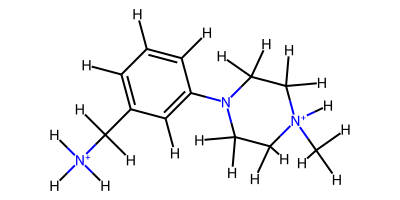
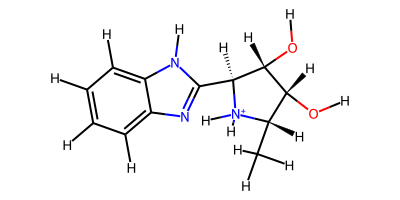
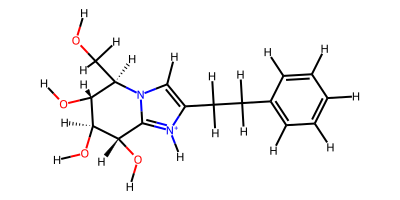
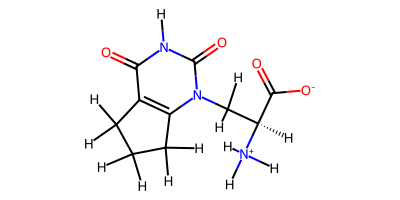
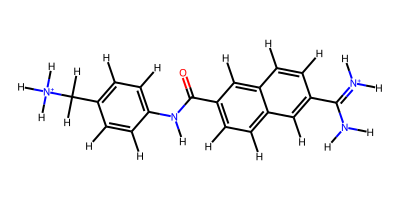
...
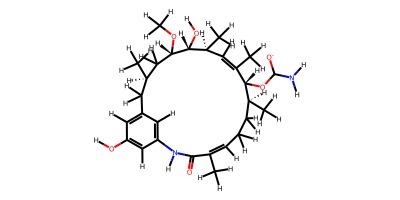
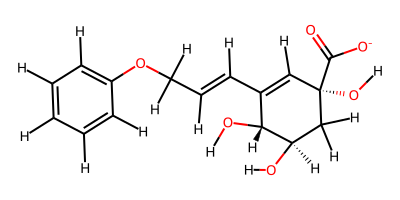
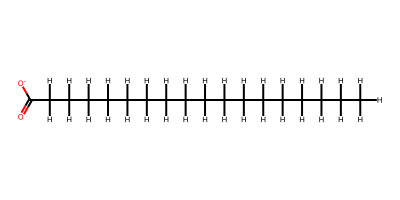
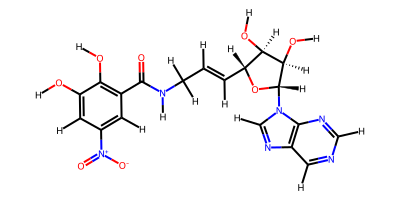
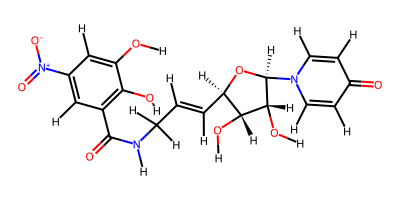

In [107]:
filtered_df.style.set_properties(subset=['2D_Image'], **{'text-align': 'center'}, )

## Работа с RESID


In [1]:
import os
import base64
from rdkit import Chem
from rdkit.Chem import AllChem, Draw
import pandas as pd
from io import BytesIO
import glob 

# Ваша функция для загрузки PDB
def pdb_to_chem(path_to_pdb, removeHs=False, make_N_root=False):
    rdkit_mol = Chem.MolFromPDBFile(path_to_pdb, removeHs)
    if not rdkit_mol:
        raise ValueError(f"Не удалось загрузить PDB файл: {path_to_pdb}")
      
    with open(path_to_pdb, "r") as pdb_file:
        pdb_lines = pdb_file.readlines()

    atom_names = [line.split()[2] for line in pdb_lines if line.startswith("ATOM") or line.startswith("HETATM")]

    if len(atom_names) != rdkit_mol.GetNumAtoms():
        raise ValueError("Число атомов в PDB файле и RDKit молекуле не совпадает!")

    for atom, name in zip(rdkit_mol.GetAtoms(), atom_names):
        atom.SetProp("AtomName", name)

    AllChem.Compute2DCoords(rdkit_mol)
    return rdkit_mol

# Вспомогательная функция для изображения
def image_to_base64(img):
    buffered = BytesIO()
    img.save(buffered, format="PNG")
    return base64.b64encode(buffered.getvalue()).decode("utf-8")

In [7]:
filename

'datasets/RESID/AA0427.PDB'

In [11]:
# Папка с файлами
folder = "datasets/RESID/"
data = []

pdb_list = glob.glob('datasets/RESID/*.PDB')
for path in pdb_list:
    # print(path)
    try:
        mol = pdb_to_chem(path)
        smiles = Chem.MolToSmiles(mol)
        img = Draw.MolToImage(mol, size=(400, 200))
        img_base64 = image_to_base64(img)
        img_html = f'<img src="data:image/png;base64,{img_base64}" width="400" height="200">'

        has_charged_atoms = any(atom.GetFormalCharge() != 0 for atom in mol.GetAtoms())
        total_charge = sum(atom.GetFormalCharge() for atom in mol.GetAtoms())
        num_atoms = mol.GetNumAtoms()
        atom_types = sorted(set(atom.GetSymbol() for atom in mol.GetAtoms()))

        data.append({
            "Molecule_Name": os.path.basename(path),
            "2D_Image": img_html,
            "smiles": smiles,
            "Has_Charged_Atoms": has_charged_atoms,
            "Total_Charge": total_charge,
            "Num_Atoms": num_atoms,
            "Atom_Types": ", ".join(atom_types)
        })
    except Exception as e:
        print(f"Ошибка при обработке {filename}: {e}")
        print(os.path.basename(path))

# Создание DataFrame
df = pd.DataFrame(data)

[12:14:47] Cannot determine element for PDB atom #10


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0376.PDB
AA0376.PDB


[12:14:48] Cannot determine element for PDB atom #41
[12:14:48] Cannot determine element for PDB atom #50
[12:14:48] Cannot determine element for PDB atom #16


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0137.PDB
AA0137.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0141.PDB
AA0141.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Число атомов в PDB файле и RDKit молекуле не совпадает!
AA0518.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0324.PDB
AA0324.PDB


[12:14:48] Cannot determine element for PDB atom #11
[12:14:48] Cannot determine element for PDB atom #97


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0135.PDB
AA0135.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0281.PDB
AA0281.PDB


[12:14:48] Cannot determine element for PDB atom #46


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0604.PDB
AA0604.PDB


[12:14:48] Cannot determine element for PDB atom #53
[12:14:48] Cannot determine element for PDB atom #113
[12:14:48] Cannot determine element for PDB atom #88
[12:14:48] Cannot determine element for PDB atom #99
[12:14:48] Cannot determine element for PDB atom #17


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0225.PDB
AA0225.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0298.PDB
AA0298.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0292.PDB
AA0292.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0600.PDB
AA0600.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0276.PDB
AA0276.PDB


[12:14:48] Cannot determine element for PDB atom #47
[12:14:49] Cannot determine element for PDB atom #153
[12:14:49] Cannot determine element for PDB atom #22
[12:14:49] Cannot determine element for PDB atom #21
[12:14:49] Cannot determine element for PDB atom #50
[12:14:49] Cannot determine element for PDB atom #11


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0289.PDB
AA0289.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0319.PDB
AA0319.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0549.PDB
AA0549.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0134.PDB
AA0134.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0393.PDB
AA0393.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0355.PDB
AA0355.PDB


[12:14:49] Cannot determine element for PDB atom #41
[12:14:49] Cannot determine element for PDB atom #11
[12:14:49] Cannot determine element for PDB atom #67


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0326.PDB
AA0326.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0334.PDB
AA0334.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0310.PDB
AA0310.PDB


[12:14:49] Cannot determine element for PDB atom #24


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0180.PDB
AA0180.PDB


[12:14:50] Cannot determine element for PDB atom #86
[12:14:50] Cannot determine element for PDB atom #47
[12:14:50] Cannot determine element for PDB atom #24


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0366.PDB
AA0366.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0285.PDB
AA0285.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0179.PDB
AA0179.PDB


[12:14:50] Cannot determine element for PDB atom #41
[12:14:50] Cannot determine element for PDB atom #13


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0288.PDB
AA0288.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0375.PDB
AA0375.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Число атомов в PDB файле и RDKit молекуле не совпадает!
AA0519.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0268.PDB
AA0268.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0139.PDB
AA0139.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0173.PDB
AA0173.PDB


[12:14:50] Cannot determine element for PDB atom #88
[12:14:50] Cannot determine element for PDB atom #31
[12:14:51] Cannot determine element for PDB atom #16
[12:14:51] Cannot determine element for PDB atom #47


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0438.PDB
AA0438.PDB


[12:14:51] Cannot determine element for PDB atom #10
[12:14:51] Cannot determine element for PDB atom #45
[12:14:51] Cannot determine element for PDB atom #10


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0358.PDB
AA0358.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0280.PDB
AA0280.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0022.PDB
AA0022.PDB


[12:14:51] Cannot determine element for PDB atom #41
[12:14:52] Cannot determine element for PDB atom #43


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0599.PDB
AA0599.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0286.PDB
AA0286.PDB


[12:14:52] Cannot determine element for PDB atom #17


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0329.PDB
AA0329.PDB


[12:14:52] Cannot determine element for PDB atom #18
[12:14:52] Cannot determine element for PDB atom #28
[12:14:52] Cannot determine element for PDB atom #21
[12:14:52] Cannot determine element for PDB atom #47


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0555.PDB
AA0555.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0279.PDB
AA0279.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0603.PDB
AA0603.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0605.PDB
AA0605.PDB


[12:14:52] Cannot determine element for PDB atom #33
[12:14:52] Cannot determine element for PDB atom #19
[12:14:52] Cannot determine element for PDB atom #41


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0142.PDB
AA0142.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0175.PDB
AA0175.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0136.PDB
AA0136.PDB


[12:14:53] Cannot determine element for PDB atom #20
[12:14:53] Cannot determine element for PDB atom #138
[12:14:53] Cannot determine element for PDB atom #83


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0176.PDB
AA0176.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0491.PDB
AA0491.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0293.PDB
AA0293.PDB


[12:14:53] Cannot determine element for PDB atom #41


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0140.PDB
AA0140.PDB


[12:14:53] Cannot determine element for PDB atom #10


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0437.PDB
AA0437.PDB


[12:14:54] Cannot determine element for PDB atom #50
[12:14:54] Cannot determine element for PDB atom #41
[12:14:54] Cannot determine element for PDB atom #43
[12:14:54] Cannot determine element for PDB atom #10


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0394.PDB
AA0394.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0271.PDB
AA0271.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0331.PDB
AA0331.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0277.PDB
AA0277.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Число атомов в PDB файле и RDKit молекуле не совпадает!
AA0508.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0524.PDB
AA0524.PDB


[12:14:54] Cannot determine element for PDB atom #21
[12:14:54] Cannot determine element for PDB atom #20
[12:14:54] Cannot determine element for PDB atom #70
[12:14:54] Cannot determine element for PDB atom #4
[12:14:55] Cannot determine element for PDB atom #80


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0174.PDB
AA0174.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0300.PDB
AA0300.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0248.PDB
AA0248.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0356.PDB
AA0356.PDB


[12:14:55] Cannot determine element for PDB atom #17
[12:14:55] Cannot determine element for PDB atom #41
[12:14:55] Cannot determine element for PDB atom #47
[12:14:55] Cannot determine element for PDB atom #54


Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0552.PDB
AA0552.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0266.PDB
AA0266.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Число атомов в PDB файле и RDKit молекуле не совпадает!
AA0511.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0284.PDB
AA0284.PDB
Ошибка при обработке datasets/RESID/AA0427.PDB: Не удалось загрузить PDB файл: datasets/RESID/AA0357.PDB
AA0357.PDB


,Molecule_Name,2D_Image,smiles,Has_Charged_Atoms,Total_Charge,Num_Atoms,Atom_Types
0,AA0269.PDB,,[H]NC([H])(CO)C([H])([H])SS[H],False,0,12,"C, H, N, O, S"
1,AA0261.PDB,,[H]NC([H])(C(O)N([H])C([H])(C(O)O[H])C([H])([H])C([H])([H])C(O)O[H])C([H])([H])C([H])([H])C(O)O[H],False,0,34,"C, H, N, O"
2,AA0539.PDB,,[H]OC(O)C([H])([H])C([H])([H])C([H])(CO)N([H])C([H])O,False,0,19,"C, H, N, O"
3,AA0287.PDB,,[H]NC([H])(CO)C([H])([H])C([H])([H])C([H])([H])C([H])([H])NC(C(O)O[H])C([H])([H])[H],False,0,28,"C, H, N, O"
4,AA0365.PDB,,[H]NC(CO)C([H])C1C([H])C([H])C(O[H])C([H])C1[H],False,0,19,"C, H, N, O"
5,AA0168.PDB,,[HH]~NC(~[HH])(CO)C(~[HH])(~[HH])C(~[HH])(~[HH])C(~[HH])(~[HH])NC(N(~[HH])C1(~[HH])OC(~[HH])(C(~[HH])(~[HH])OP2(O)(O~[HH])OP2(O)(OC(~[HH])(~[HH])C2(~[HH])OC(~[HH])(N3C4NC(~[HH])NC(N(~[HH])~[HH])C4NC3~[HH])C(~[HH])(O~[HH])C2(~[HH])O~[HH])O~[HH])C(~[HH])(O~[HH])C1(~[HH])O~[HH])N(~[HH])~[HH],False,0,79,"C, H, N, O, P"
6,AA0473.PDB,,[H]OC1([H])NC([H])(CO)C([H])(C([H])([H])[H])C1([H])[H],False,0,18,"C, H, N, O"
7,AA0416.PDB,,[H]NC([H])(CO)C([H])([H])SC(O)C([H])(N[H])C([H])([H])C1C([H])C([H])C(O[H])C([H])C1[H],False,0,31,"C, H, N, O, S"
8,AA0087.PDB,,[H]NC([H])(C(O)N([H])[H])C([H])([H])C([H])([H])C(O)O[H],False,0,19,"C, H, N, O"
9,AA0145.PDB,,[H]NC([H])(CO)C([H])([H])C1C([H])C([H])C(OC([H])([H])C2C([H])C3C(NC4C(O)N([H])C(O)NC4N3C([H])([H])C([H])(O[H])C([H])(O[H])C([H])(O[H])C([H])([H])O[PH](O)(O[H])O[PH](O)(O[H])OC([H])([H])C3([H])OC([H])(N4C([H])NC5C(N([H])[H])NC([H])NC54)C([H])(O[H])C3([H])O[H])C([H])C2C([H])([H])[H])C([H])C1[H],False,0,105,"C, H, N, O, P"

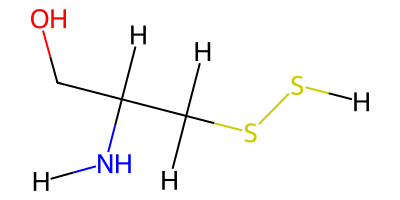
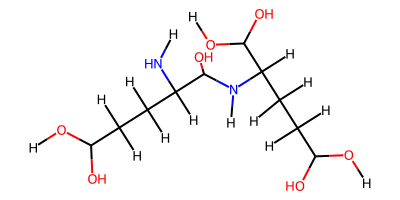
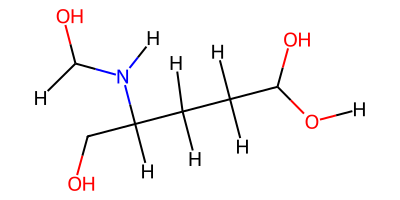
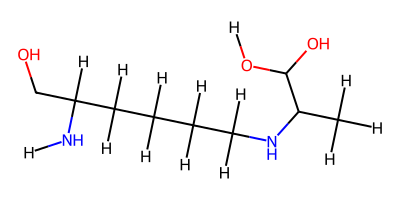
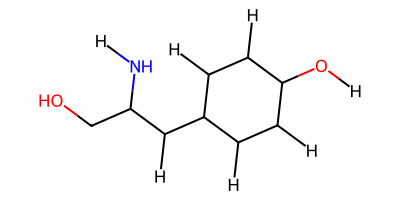
...
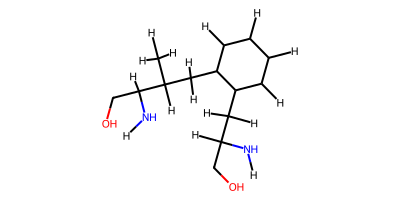
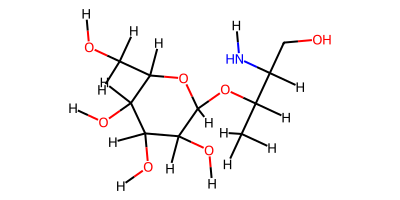
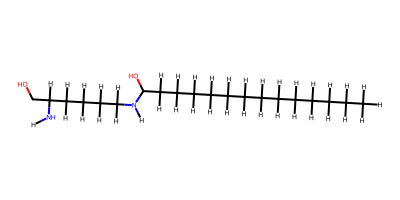
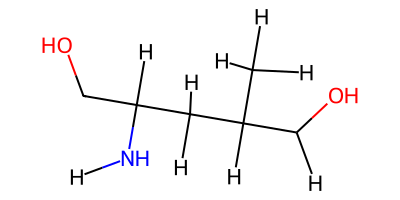
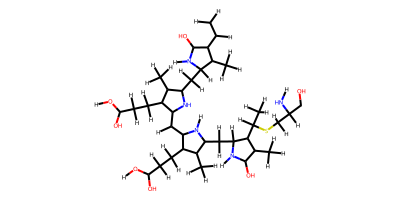

In [12]:
# Отображение таблицы (можно заменить на сохранение в CSV/HTML)
from IPython.display import display, HTML
display(HTML(df.to_html(escape=False)))  # escape=False чтобы показывались изображения

In [9]:
df.shape

(523, 7)

## Распаковка тестового набора из ChEBI (amino acids)

In [19]:
import xml.etree.ElementTree as ET
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Draw, Descriptors
from rdkit.Chem import AllChem, rdFMCS
from io import BytesIO
import base64
import numpy as np

In [2]:
def image_to_base64(img):
    buffered = BytesIO()
    img.save(buffered, format="PNG")
    return base64.b64encode(buffered.getvalue()).decode()



In [3]:
def parse_chebi_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    
    entries = []
    
    for entry in root.findall('ENTRY'):
        id_ = entry.find('ID').text if entry.find('ID') is not None else 'Unknown'
        name = entry.find('IUPAC_NAME').text if entry.find('IUPAC_NAME') is not None else None
        smiles = entry.find('SMILES').text if entry.find('SMILES') is not None else None
        entries.append((id_ ,name, smiles))
    
    return entries

In [4]:
def smi_to_chem(str_smi: str, sanitize=True, addH=True, make_N_root=False):
    """
    Преобразует SMILES-строку в объект молекулы RDKit и добавляет атомы водорода.
    """
    rdkit_mol = Chem.MolFromSmiles(str_smi, sanitize) # переводим во внутренний формат chem
    if addH:
        rdkit_mol = Chem.AddHs(rdkit_mol) # протонируем
        
    # Перенумерация атомов, деля аминогруппу началом молекулы
    if make_N_root:
        # Находим индекс азота из аминогруппы
        root_idx = find_amino_nitrogen(rdkit_mol)
        if root_idx != -1:
            # Получаем SMILES с корневым атомом
            smiles_string = Chem.MolToSmiles(rdkit_mol, canonical=True, allHsExplicit=True, rootedAtAtom=root_idx)
            # Создаем новую молекулу из SMILES
            rdkit_mol = Chem.MolFromSmiles(smiles_string, sanitize=False)
            if rdkit_mol is None:
                raise ValueError("Ошибка при создании молекулы после перенумерации атомов")
        else:
            print("Азот аминогруппы не найден. Корень не изменён.")
        # Chem.SanitizeMol(rdkit_mol, sanitizeOps=Chem.SANITIZE_ALL ^ Chem.SANITIZE_KEKULIZE, catchErrors=True)
        Chem.SanitizeMol(rdkit_mol)
        
        # Сортируем атомы, чтобы тяжелые атомы шли первыми, а водороды позже
        atom_order = [atom.GetIdx() for atom in rdkit_mol.GetAtoms() if atom.GetSymbol() != 'H']  # тяжелые атомы
        atom_order += [atom.GetIdx() for atom in rdkit_mol.GetAtoms() if atom.GetSymbol() == 'H']  # водороды
    
        # Перенумерация атомов согласно новому порядку
        new_rdkit_mol = Chem.RenumberAtoms(rdkit_mol, atom_order)
        # Пересчитываем валентности
        return new_rdkit_mol
    else:
        return rdkit_mol

In [6]:
xml_file = "datasets/ChEBI_15K.xml"
entries = parse_chebi_xml(xml_file)

In [7]:
entries

[('CHEBI:68512',
  'N-[(4-{[(2-amino-4-oxo-3,4,5,6,7,8-hexahydropteridin-6-yl)methyl]amino}phenyl)carbonyl]poly(gamma-L-glutamyl)-L-glutamic acid',
  None),
 ('CHEBI:53375', None, None),
 ('CHEBI:53373', None, None),
 ('CHEBI:28624',
  'N-[(4-{[(2-amino-4-oxo-3,4,5,6,7,8-hexahydropteridin-6-yl)methyl]amino}phenyl)carbonyl]poly(gamma-glutamyl)glutamic acid',
  None),
 ('CHEBI:53374', None, None),
 ('CHEBI:62579', None, None),
 ('CHEBI:65318', None, None),
 ('CHEBI:16670', 'peptides', None),
 ('CHEBI:17739', None, None),
 ('CHEBI:53308',
  'poly{(1S)-1-carboxy-2-[2-(3-thienyl)ethoxy]ethanaminium chloride}',
  None),
 ('CHEBI:63907', None, None),
 ('CHEBI:68564', None, None),
 ('CHEBI:28010', None, None),
 ('CHEBI:71226', None, None),
 ('CHEBI:30526', '1-aminocyclopropane-1-carboxylate', 'NC1(CC1)C([O-])=O'),
 ('CHEBI:43164',
  '[(3S)-2-oxotetrahydrofuran-3-yl]amino',
  'C1OC([C@H](C1)N*)=O'),
 ('CHEBI:64494',
  '(2S)-2-{[(5S,8S)-1-[(2R,3S,4R,5S)-5-{[(2R,3S,4S)-5-(4-{[(1R)-1-(2-amino-4-ox

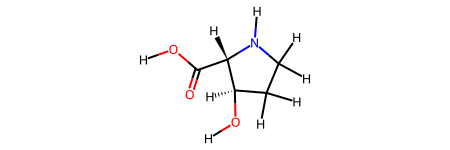

In [125]:
test_smi = entries[221][2]
smi_to_chem(test_smi)

In [8]:
mol_data = []

for id_s, name, smiles in entries:
    try:
        if id_s and smiles:
            mol = Chem.MolFromSmiles(smiles)
            
            AllChem.Compute2DCoords(mol)

            img = Draw.MolToImage(mol, size=(400, 200))
            img_base64 = image_to_base64(img)
            img_html = f'<img src="data:image/png;base64,{img_base64}" width="400" height="200">'

            total_charge = sum(atom.GetFormalCharge() for atom in mol.GetAtoms())

            num_atoms = mol.GetNumAtoms()

            has_charged_atoms = any(atom.GetFormalCharge() != 0 for atom in mol.GetAtoms())

            atom_types = sorted(set(atom.GetSymbol() for atom in mol.GetAtoms()))
            atom_types_str = ",".join(atom_types)

            mol_data.append([id_s, img_html, smiles, has_charged_atoms, total_charge, num_atoms, atom_types_str])
    except:
        continue
columns = ["Molecule_Name", "2D_Image", "smiles", "Has_Charged_Atoms", "Total_Charge", "Num_Atoms", "Atom_Types"]
df_ChEBI = pd.DataFrame(mol_data, columns=columns)

[11:32:43] WARNING: not removing hydrogen atom without neighbors
[11:33:03] WARNING: not removing hydrogen atom without neighbors
[11:33:05] WARNING: not removing hydrogen atom without neighbors
[11:33:05] Explicit valence for atom # 3 O, 3, is greater than permitted
[11:33:05] Explicit valence for atom # 4 O, 3, is greater than permitted
[11:33:07] Explicit valence for atom # 10 O, 3, is greater than permitted
[11:33:12] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[11:33:13] WARNING: not removing hydrogen atom without neighbors
[11:33:14] WARNING: not removing hydrogen atom without neighbors
[11:35:16] WARNING: not removing hydrogen atom without neighbors
[11:35:16] WARNING: not removing hydrogen atom without neighbors
[11:35:16] WARNING: not removing hydrogen atom without neighbors
[11:35:16] WARNING: not removing hydrogen atom without neighbors
[11:35:16] WARNING: not removing hydrogen atom without neighbors
[11:35:16] WARNING: not removing hydrogen atom without neig

,Molecule_Name,2D_Image,smiles,Has_Charged_Atoms,Total_Charge,Num_Atoms,Atom_Types
0,CHEBI:30526,,NC1(CC1)C([O-])=O,True,-1,7,"C,N,O"
1,CHEBI:43164,,C1OC([C@H](C1)N*)=O,False,0,8,"*,C,N,O"
2,CHEBI:64494,,C[C@@H](Nc1ccc(C[C@H](O)[C@H](O)[C@H](O)CO[C@H]2O[C@H](COP(O)(=O)O[C@@H](CCC(O)=O)C(=O)N[C@@H](CCC(O)=O)C(=O)N[C@@H](CC(O)=O)C(O)=O)[C@@H](O)[C@H]2O)cc1)c1c[nH]c2nc(N)nc(=O)c2n1,False,0,69,"C,N,O,P"
3,CHEBI:93968,,COCCOC(=O)N1C2=C(C=C(C=C2)C#CCC(C(=O)OC)C(=O)OC)[C@@]3(C1=O)[C@H]([C@@H]4C(=O)O[C@H]([C@H](N4[C@H]3C5=CC=C(C=C5)OCCO)C6=CC=CC=C6)C7=CC=CC=C7)C(=O)N8CCN(CC8)C9=NC=CC=N9,False,0,74,"C,N,O"
4,CHEBI:94066,,COCCOC(=O)N1C2=C(C=C(C=C2)C#CCC(C(=O)OC)C(=O)OC)[C@@]3(C1=O)[C@H]([C@@H]4C(=O)O[C@H]([C@H](N4[C@H]3C5=CC=CC=C5OCCO)C6=CC=CC=C6)C7=CC=CC=C7)C(=O)N8CCN(CC8)C9=NC=CC=N9,False,0,74,"C,N,O"

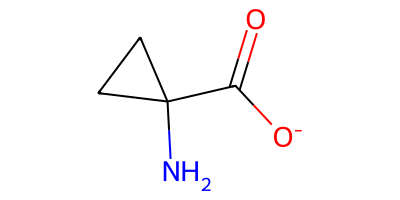
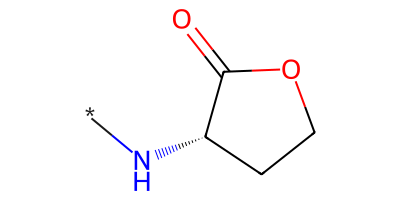
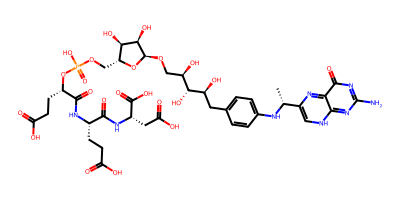
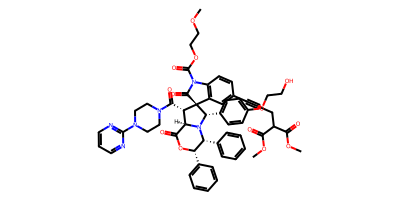
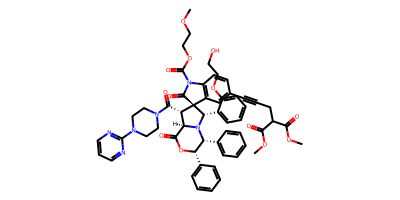

In [10]:
df_ChEBI[:5].style.set_properties(subset=['2D_Image'], **{'text-align': 'center'}, )

In [11]:
import pandas as pd
import re

# Загрузка данных
df = df_ChEBI # Укажите правильный разделитель

# 1. Молекулы без заряженных атомов
neutral_molecules = df[
    ~df["smiles"].str.contains(r"\[.*[+-].*\]", regex=True, na=False)
]

# 2. Молекулы с заряженными атомами (отрицательный суммарный заряд)
charged_negative = df[
    (df["Total_Charge"] < 0) & 
    (df["smiles"].str.contains(r"\[.*[+-].*\]", regex=True, na=False))
]

# 3. Молекулы с заряженными атомами (положительный суммарный заряд)
charged_positive = df[
    (df["Total_Charge"] > 0) & 
    (df["smiles"].str.contains(r"\[.*[+-].*\]", regex=True, na=False))
]

# Функция для извлечения типов заряженных атомов
def extract_charged_atoms(smiles):
    atoms = re.findall(r"\[([A-Za-z]+)[^]]*[+-]+\]", smiles)
    return list(set(atoms))  # Уникальные атомы

# Анализ распределения атомов в группах
def analyze_group(group, name):
    print(f"\n{name} ({len(group)} молекул):")
    
    # Сбор всех заряженных атомов
    all_charged_atoms = []
    for s in group["smiles"]:
        all_charged_atoms.extend(extract_charged_atoms(s))
    
    # Подсчет частоты
    if all_charged_atoms:
        freq = pd.Series(all_charged_atoms).value_counts()
        print("Распределение заряженных атомов:")
        print(freq.to_string())
    else:
        print("Заряженные атомы не обнаружены")

# Вывод результатов
print(f"Всего молекул: {len(df)}")
print(f"1. Без заряженных атомов: {len(neutral_molecules)}")
analyze_group(charged_negative, "2. Заряженные атомы (отрицательный заряд)")
analyze_group(charged_positive, "3. Заряженные атомы (положительный заряд)")

Всего молекул: 14854
1. Без заряженных атомов: 13318

2. Заряженные атомы (отрицательный заряд) (719 молекул):
Распределение заряженных атомов:
O     719
NH    258
N       6
n       5
nH      3
Gd      1

3. Заряженные атомы (положительный заряд) (164 молекул):
Распределение заряженных атомов:
NH    132
O     101
N      31
S       3
Se      3
n       2
Fe      1
H       1


In [133]:
# df_ChEBI.to_csv('ChEBI_amino_1100.csv', index=False)

In [33]:
df_ChEBI[990:1050]

,Molecule_Name,2D_Image,smiles,Has_Charged_Atoms,Total_Charge,Num_Atoms,Atom_Types
990,CHEBI:44170,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",N[C@@H](CC1=CC2=CC=CC=C2C=C1)C(O)=O,False,0,16,"C,N,O"
991,CHEBI:33228,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",CC1(C)CC(N)(CC(C)(C)N1[O])C(O)=O,False,0,15,"C,N,O"
992,CHEBI:74439,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",CCCCCCCCC(=O)NCC(O)=O,False,0,15,"C,N,O"
993,CHEBI:46650,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",[H]C(Cl)=C(Cl)SC[C@H](N)C(O)=O,False,0,11,"C,Cl,N,O,S"
994,CHEBI:46651,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",N[C@@H](CS\C(Cl)=C/Cl)C(O)=O,False,0,11,"C,Cl,N,O,S"
995,CHEBI:46654,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",N[C@@H](CS\C(Cl)=C\Cl)C(O)=O,False,0,11,"C,Cl,N,O,S"
996,CHEBI:31204,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",N(CC([O-])=O)C(C=1C=CC(=CC1)N)=O.[Na+],True,0,15,"C,N,Na,O"
997,CHEBI:74407,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",COC(=O)\C=C\C(=O)NC[C@H](N)C(O)=O,False,0,15,"C,N,O"
998,CHEBI:61508,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",[H]C(=O)CCCNC(=O)CC[C@H]([NH3+])C([O-])=O,True,0,15,"C,N,O"
999,CHEBI:133217,"<img src=""data:image/png;base64,iVBORw0KGgoAAA...",C(CCNC(=O)C)[C@@H](C(O)=O)NC(=O)C,False,0,15,"C,N,O"


In [36]:
allowed_atoms = {"C", "N", "H", "O", "P", "S"}
filtered_df = df_ChEBI[df_ChEBI["Atom_Types"].apply(lambda x: set(x.split(",")) <= allowed_atoms)]
filtered_df = df_ChEBI[(df_ChEBI["Has_Charged_Atoms"] == True) &
                       (df_ChEBI["Num_Atoms"] <= 30) &
                       df_ChEBI["Atom_Types"].apply(lambda x: set(x.split(",")) <= allowed_atoms)]
len(filtered_df)

948

In [20]:
sampels = np.random.randint(0, len(filtered_df), size=50)
sampels

array([622, 625, 390, 413, 626, 182, 709, 661, 274, 356, 293, 177, 165,
       420, 458, 281, 708, 230, 179,  39, 171,   7, 554, 205, 639, 398,
        17, 690, 363, 318, 590, 602, 660, 524, 297,  79, 169, 227, 490,
        66, 137, 192, 355, 126, 348, 398, 538, 482, 329, 106])

In [21]:
filtered_df.iloc(0)

,Molecule_Name,2D_Image,smiles,Has_Charged_Atoms,Total_Charge,Num_Atoms,Atom_Types
4403,CHEBI:138619,,N1(C=2C(=C(N=CN2)N)N=C1)[C@@H]3O[C@H](COP([O-])(OC([C@@H](C)[NH3+])=O)=O)[C@H]([C@H]3O)O,True,0,28,"C,N,O,P"
14158,CHEBI:57511,,[H][C@]12SCC(COC(C)=O)=C(N1C(=O)[C@H]2NC(=O)CCC[C@@H]([NH3+])C([O-])=O)C([O-])=O,True,-1,28,"C,N,O,S"
667,CHEBI:65070,,[NH3+]CCC[NH2+]CC[C@H]([NH3+])C([O-])=O,True,2,12,"C,N,O"
415,CHEBI:73939,,[H][C@@]12CC[C@H](N1C(=O)C2)C([O-])=O,True,-1,11,"C,N,O"
202,CHEBI:63137,,OC1C[NH2+]C(C1)C([O-])=O,True,0,9,"C,N,O"
13556,CHEBI:195214,,[NH3+]CC(=O)NCC(=O)NCC([O-])=O,True,0,13,"C,N,O"
775,CHEBI:63968,,CC(=[NH2+])NCCCC[C@H]([NH3+])C(O)=O,True,2,13,"C,N,O"
456,CHEBI:84981,,NC(CCCC([O-])=O)C([O-])=O,True,-2,11,"C,N,O"
951,CHEBI:64178,,N[C@H](C([O-])=O)C(=O)COP([O-])([O-])=O,True,-3,13,"C,N,O,P"
1272,CHEBI:62497,,CC(C)=CCc1cccc2c(C[C@H]([NH3+])C([O-])=O)c[nH]c12,True,0,20,"C,N,O"

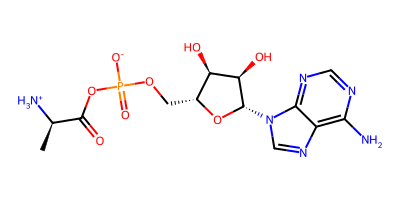
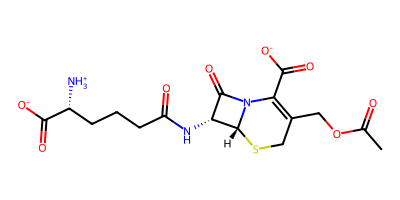
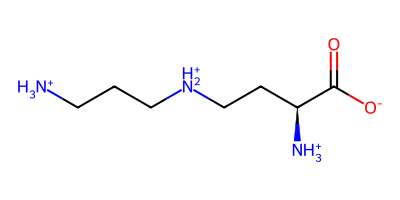
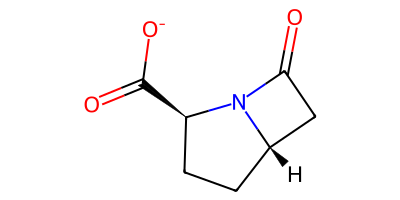
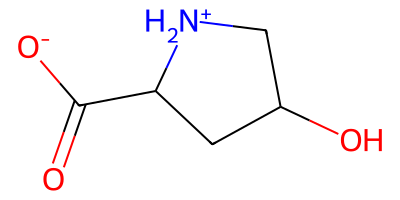
...
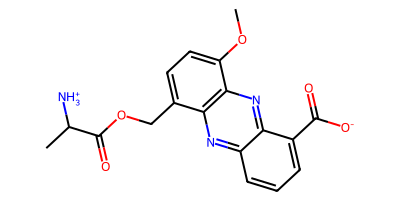
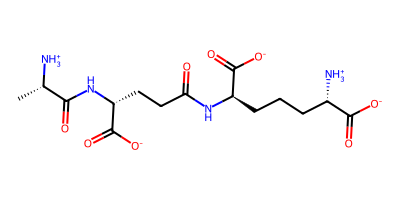
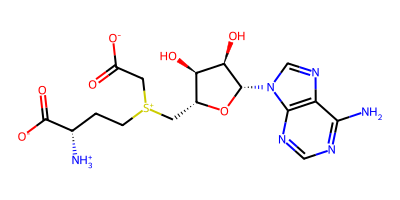
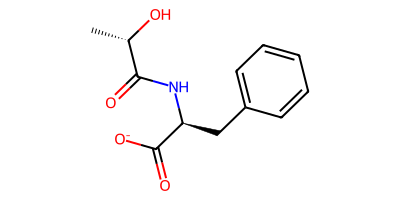
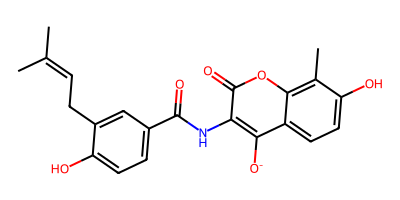

In [37]:
random_s30 = filtered_df.sample(n=100, random_state=42)
random_s30.style.set_properties(subset=['2D_Image'], **{'text-align': 'center'}, )


In [38]:
sampled_df = random_s30.reset_index(drop=True)
sampled_df.to_csv('datasets/ChEBI_100_from_15K.csv')

## Изучение RESID 

In [11]:
import requests
import sys
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.notebook import tqdm  # Используем notebook-версию tqdm
import pandas as pd
import time
import re

### Парсинг residues.ttx (880 молекул? )

In [ ]:
data_list = []
with open('residues.ttx') as f:
    for line in f:
        line_edd = line.rstrip().lstrip()
        if not line_edd.isdigit() :
        # print( if line bot numer)
            data_list.append(line_edd)

In [ ]:
data_list[0:5]

['(2R)-4-((2S)-2-amino-2-carboxyethyl)phosphonato-2-hydroxy-N-[3-(2-mercaptoethyl)amino-3-oxopropyl]-3,3-dimethylbutanamide',
 '(2R,3R)-18-ethyl-3-[(1R)-1-(((2R)-2-amino-2-carboxy)ethylthio)ethyl]-1,2,3,19,21,22,24-heptahydro-2,7,13,17-tetramethyl-1,19-dioxo-(21H,22H,24H)-bilin-8,12-dipropanoic acid',
 '(2R,3S)-2-amino-3-methylpentanoic acid',
 '(2R,3Xi)-2-amino-3-methylthiobutanedioic acid',
 '(2S)-1-acetyl-2-pyrrolidinecarboxylic acid']

In [ ]:
len(data_list)

884

### Парсинг residues.ref (283 молекулы)

In [38]:
def parse_residues_file(file_path):
    results = []
    with open(file_path, 'r') as file:
        lines = file.readlines()
        i = 0
        while i < len(lines):
            line = lines[i].strip()
            if line.startswith(">TX;"):  # Ищем строку с ID (начинается с ">TX;")
                entry = {}  # Создаем словарь для хранения данных
                entry["Local ID"] = line.split(";")[1].strip()  # Сохраняем локальный ID   
                i += 1 # Название молекулы (следующая строка)
                entry["Molecule Name"] = lines[i].strip()
                i += 1 # Продолжаем чтение до следующего ID или конца файла
                while i < len(lines) and not lines[i].startswith(">TX;"):
                    line = lines[i].strip()
                    # Извлекаем Systematic name
                    if line.startswith("N;Systematic name:"):
                        entry["Systematic Name"] = line.split(":", 1)[1].strip()
                    # Извлекаем Formula
                    if line.startswith("C;Formula:"):
                        entry["Formula"] = line.split(":", 1)[1].strip()
                    # Извлекаем Cross-references
                    if line.startswith("A;Cross-references:"):
                        entry["Cross-references"] = line.split(":", 1)[1].strip()
                    # Извлекаем Sequence code
                    if line.startswith("C;Sequence code:"):
                        entry["Sequence Code"] = line.split(":", 1)[1].strip()
                    i += 1
                # Добавляем запись в результаты
                results.append(entry)
            else:
                i += 1
    return results

In [39]:
file_path = "residues.ref"
parsed_data = parse_residues_file(file_path)

In [42]:
parsed_data[:3]

[{'Local ID': 'AA0000',
  'Molecule Name': 'L-alpha-aminoacid',
  'Formula': 'C 2 H 3 N 1 O 1 +',
  'Sequence Code': 'X'},
 {'Local ID': 'AA0001',
  'Molecule Name': 'L-alanine',
  'Systematic Name': '(S)-2-aminopropanoic acid',
  'Cross-references': 'CAS:56-41-7',
  'Formula': 'C 3 H 5 N 1 O 1',
  'Sequence Code': 'A'},
 {'Local ID': 'AA0002',
  'Molecule Name': 'L-arginine',
  'Systematic Name': '(S)-2-amino-5-guanidinopentanoic acid',
  'Cross-references': 'CAS:74-79-3',
  'Formula': 'C 6 H 12 N 4 O 1',
  'Sequence Code': 'R'}]

In [43]:
len(parsed_data)

283

In [44]:
RESID_283 = pd.DataFrame(parsed_data)

In [45]:
RESID_283[:20]

,Local ID,Molecule Name,Formula,Sequence Code,Systematic Name,Cross-references
0,AA0000,L-alpha-aminoacid,C 2 H 3 N 1 O 1 +,X,NaN,NaN
1,AA0001,L-alanine,C 3 H 5 N 1 O 1,A,(S)-2-aminopropanoic acid,CAS:56-41-7
2,AA0002,L-arginine,C 6 H 12 N 4 O 1,R,(S)-2-amino-5-guanidinopentanoic acid,CAS:74-79-3
3,AA0003,L-asparagine,C 4 H 6 N 2 O 2,N,(S)-2-amino-4-butanediamic acid,CAS:70-47-3
4,AA0004,L-aspartic acid,C 4 H 5 N 1 O 3,D #link ASP; N #link ASN,(S)-2-aminobutanedioic acid,CAS:56-84-8
5,AA0005,L-cysteine,C 3 H 5 N 1 O 1 S 1,C,(R)-2-amino-3-mercaptopropanoic acid,CAS:52-90-4
6,AA0006,L-glutamic acid,C 5 H 7 N 1 O 3,E,(S)-2-aminopentanedioic acid,CAS:56-86-0
7,AA0007,L-glutamine,C 5 H 8 N 2 O 2,Q,(S)-2-amino-5-pentanediamic acid,CAS:56-85-9
8,AA0008,glycine,C 2 H 3 N 1 O 1,G,aminoethanoic acid,CAS:56-40-6
9,AA0009,L-histidine,C 6 H 7 N 3 O 1,H,(S)-2-amino-3-(1H-imidazol-4-yl)propanoic acid,CAS:71-00-1


In [ ]:
search_pubchem(chemical_name = '56-41-7')

https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/name/56-41-7/JSON


## Проверка надичия соединений в PubChem

In [83]:
from libchebipy import ChebiEntity
# from libchebipy._chebi_entity import ChebiEntity
import time
import pubchempy as pcp
import time
import pandas as pd
from tqdm.notebook import tqdm  

In [84]:
def search_pubchem_by_cas(cas_number, delay=1):
    """
    Ищет соединение в PubChem по CAS-номеру и возвращает данные:
    - SMILES
    - CID
    - Заряд
    - Молекулярная формула
    """
    try:
        # Поиск соединения по CAS-номеру
        compounds = pcp.get_compounds(cas_number, 'name', listkey_count=1)
        
        if compounds:
            compound = compounds[0]  # Берем первое найденное соединение
            return {
                "SMILES": compound.isomeric_smiles,
                "CID": compound.cid,
                "Charge": compound.charge,
                "Molecular Formula": compound.molecular_formula
            }
        else:
            return None  # Соединение не найдено
    
    except Exception as e:
        print(f"⚠️ Ошибка при поиске CAS {cas_number} в PubChem: {e}")
        return None
    
    finally:
        time.sleep(delay)  # Задержка между запросами

In [81]:
# def search_chebi_by_cas(cas_number, retries=3, delay=2):
#     """
#     Ищет соединение в ChEBI по CAS-номеру и возвращает данные:
#     - ChEBI ID
#     - SMILES
#     - Формула
#     - Заряд
#     """
#     for attempt in range(retries):
#         try:
#             # Поиск соединения по CAS-номеру
#             entities = ChebiEntity.(cas_number, "REGISTRY NUMBER")
            
#             # Если найдены результаты
#             if entities:
#                 entity = entities[0]  # Берем первое найденное соединение
#                 return {
#                     "ChEBI ID": entity.get_id(),
#                     "SMILES": entity.get_smiles(),
#                     "Molecular Formula": entity.get_formula(),
#                     "Charge": entity.get_charge()
#                 }
#             else:
#                 print(f"⚠️ CAS {cas_number}: Соединение не найдено в ChEBI.")
#                 return None
        
#         except Exception as e:
#             print(f"⚠️ CAS {cas_number}: Ошибка при запросе к ChEBI: {e}")
#             time.sleep(delay)  # Ждем перед повторной попыткой
    
#     print(f"❌ CAS {cas_number}: Не удалось получить данные после {retries} попыток.")
#     return None

In [85]:
def enrich_dataframe_with_cas(df):
    """
    Обогащает DataFrame данными из PubChem и ChEBI по CAS-номеру:
    - Добавляет SMILES, CID, Charge, Molecular Formula (из PubChem).
    - Добавляет ChEBI ID (из ChEBI).
    - Если соединение не найдено, заполняет поля NaN.
    """
    results = []
    
    for index, row in tqdm(df.iterrows(), total=len(df)):
        # Получаем значение из столбца "Cross-references"
        cross_references = row["Cross-references"]
        
        # Проверяем, что значение не NaN и не None
        if pd.notna(cross_references) and isinstance(cross_references, str):
            # Извлекаем CAS-номер (предполагаем формат "CAS:XXXXXX")
            if "CAS:" in cross_references:
                cas_number = cross_references.split("CAS:")[1].strip()
                print(f"🔍 Поиск данных для CAS: {cas_number}")
                
                # Поиск данных в PubChem
                pubchem_data = search_pubchem_by_cas(cas_number)
                print(pubchem_data)
                # Поиск данных в ChEBI
                # chebi_id = search_chebi_by_cas(cas_number)
                
                # Добавляем результаты
                results.append({
                    "Local ID": row["Local ID"],
                    "Molecule Name": row["Molecule Name"],
                    "CAS Number": cas_number,
                    "SMILES": pubchem_data["SMILES"] if pubchem_data else None,
                    "CID": pubchem_data["CID"] if pubchem_data else None,
                    "Charge": pubchem_data["Charge"] if pubchem_data else None,
                    "Molecular Formula": pubchem_data["Molecular Formula"] if pubchem_data else None,
                    "ChEBI ID": chebi_id
                })
            else:
                # Если CAS-номер не найден в "Cross-references"
                results.append({
                    "Local ID": row["Local ID"],
                    "Molecule Name": row["Molecule Name"],
                    "CAS Number": None,
                    "SMILES": None,
                    "CID": None,
                    "Charge": None,
                    "Molecular Formula": None,
                    "ChEBI ID": None
                })
        else:
            # Если значение в "Cross-references" NaN или None
            results.append({
                "Local ID": row["Local ID"],
                "Molecule Name": row["Molecule Name"],
                "CAS Number": None,
                "SMILES": None,
                "CID": None,
                "Charge": None,
                "Molecular Formula": None,
                "ChEBI ID": None
            })
    
    # Создаем новый DataFrame с результатами
    enriched_df = pd.DataFrame(results)
    return enriched_df

In [ ]:
enriched_df = enrich_dataframe_with_cas(RESID_283)
enriched_df

  0%|          | 0/283 [00:00<?, ?it/s]

🔍 Поиск данных для CAS: 56-41-7
{'SMILES': 'C[C@@H](C(=O)O)N', 'CID': 5950, 'Charge': 0, 'Molecular Formula': 'C3H7NO2'}
🔍 Поиск данных для CAS: 74-79-3
{'SMILES': 'C(C[C@@H](C(=O)O)N)CN=C(N)N', 'CID': 6322, 'Charge': 0, 'Molecular Formula': 'C6H14N4O2'}
🔍 Поиск данных для CAS: 70-47-3
{'SMILES': 'C([C@@H](C(=O)O)N)C(=O)N', 'CID': 6267, 'Charge': 0, 'Molecular Formula': 'C4H8N2O3'}
🔍 Поиск данных для CAS: 56-84-8
{'SMILES': 'C([C@@H](C(=O)O)N)C(=O)O', 'CID': 5960, 'Charge': 0, 'Molecular Formula': 'C4H7NO4'}
🔍 Поиск данных для CAS: 52-90-4
{'SMILES': 'C([C@@H](C(=O)O)N)S', 'CID': 5862, 'Charge': 0, 'Molecular Formula': 'C3H7NO2S'}
🔍 Поиск данных для CAS: 56-86-0
{'SMILES': 'C(CC(=O)O)[C@@H](C(=O)O)N', 'CID': 33032, 'Charge': 0, 'Molecular Formula': 'C5H9NO4'}
🔍 Поиск данных для CAS: 56-85-9
{'SMILES': 'C(CC(=O)N)[C@@H](C(=O)O)N', 'CID': 5961, 'Charge': 0, 'Molecular Formula': 'C5H10N2O3'}
🔍 Поиск данных для CAS: 56-40-6
{'SMILES': 'C(C(=O)O)N', 'CID': 750, 'Charge': 0, 'Molecular Formu

In [99]:
enriched_df[:30]

,Local ID,Molecule Name,CAS Number,SMILES,CID,Charge,Molecular Formula,ChEBI ID
0,AA0000,L-alpha-aminoacid,None,None,NaN,NaN,None,None
1,AA0001,L-alanine,56-41-7,C[C@@H](C(=O)O)N,5950.0,0.0,C3H7NO2,None
2,AA0002,L-arginine,74-79-3,C(C[C@@H](C(=O)O)N)CN=C(N)N,6322.0,0.0,C6H14N4O2,None
3,AA0003,L-asparagine,70-47-3,C([C@@H](C(=O)O)N)C(=O)N,6267.0,0.0,C4H8N2O3,None
4,AA0004,L-aspartic acid,56-84-8,C([C@@H](C(=O)O)N)C(=O)O,5960.0,0.0,C4H7NO4,None
5,AA0005,L-cysteine,52-90-4,C([C@@H](C(=O)O)N)S,5862.0,0.0,C3H7NO2S,None
6,AA0006,L-glutamic acid,56-86-0,C(CC(=O)O)[C@@H](C(=O)O)N,33032.0,0.0,C5H9NO4,None
7,AA0007,L-glutamine,56-85-9,C(CC(=O)N)[C@@H](C(=O)O)N,5961.0,0.0,C5H10N2O3,None
8,AA0008,glycine,56-40-6,C(C(=O)O)N,750.0,0.0,C2H5NO2,None
9,AA0009,L-histidine,71-00-1,C1=C(NC=N1)C[C@@H](C(=O)O)N,6274.0,0.0,C6H9N3O2,None


In [107]:
type(enriched_df.iloc[0]['Charge'])

numpy.float64

In [109]:
import numpy as np
replaced_df = enriched_df.replace({np.nan: None})
replaced_df

,Local ID,Molecule Name,CAS Number,SMILES,CID,Charge,Molecular Formula,ChEBI ID
0,AA0000,L-alpha-aminoacid,None,None,None,None,None,None
1,AA0001,L-alanine,56-41-7,C[C@@H](C(=O)O)N,5950.0,0.0,C3H7NO2,None
2,AA0002,L-arginine,74-79-3,C(C[C@@H](C(=O)O)N)CN=C(N)N,6322.0,0.0,C6H14N4O2,None
3,AA0003,L-asparagine,70-47-3,C([C@@H](C(=O)O)N)C(=O)N,6267.0,0.0,C4H8N2O3,None
4,AA0004,L-aspartic acid,56-84-8,C([C@@H](C(=O)O)N)C(=O)O,5960.0,0.0,C4H7NO4,None
...,...,...,...,...,...,...,...,...
278,AA0286,tris-L-cysteinyl-L-aspartato tetrairon tetrasu...,None,None,None,None,None,None
279,AA0287,N6-pyruvic acid 2-iminyl-L-lysine,None,None,None,None,None,None
280,AA0288,tris-L-cysteinyl-L-serinyl tetrairon tetrasulfide,None,None,None,None,None,None
281,AA0289,bis-L-cysteinyl-L-N3'-histidino-L-serinyl tetr...,None,None,None,None,None,None


In [114]:
chrget_RESID_283 = replaced_df[(replaced_df['Charge'] != 0) & (replaced_df['Charge'].notna())]
chrget_RESID_283

,Local ID,Molecule Name,CAS Number,SMILES,CID,Charge,Molecular Formula,ChEBI ID
66,AA0066,"N,N-dimethyl-L-proline",51705-67-0,C[N+]1(CCC[C@H]1C(=O)O)C,448301.0,1.0,C7H14NO2+,None
74,AA0074,"N6,N6,N6-trimethyl-L-lysine",19253-88-4,C[N+](C)(C)CCCC[C@@H](C(=O)O)N,440121.0,1.0,C9H21N2O2+,None
201,AA0209,dermatan 4-sulfate D-glucuronyl-D-galactosyl-D...,24967-94-0,CC(=O)N[C@@H]1[C@H]([C@H]([C@H](O[C@H]1O)CO)OS...,32756.0,-2.0,C14H21NO15S-2,None


### Запросы в базы данных 

In [9]:
# Проверка каждого вещества
results = []
for chemical in tqdm(data_list[2:4]):
    exists = search_pubchem(chemical)
    results.append({"Chemical": chemical, "Exists in PubChem": exists})

# Сохранение результатов в DataFrame
df = pd.DataFrame(results)

# Вывод результатов
print(df)

# Сохранение результатов в CSV
# df.to_csv("pubchem_check_results.csv", index=False)

  0%|          | 0/2 [00:00<?, ?it/s]

⚠️ (2R,3S)-2-amino-3-methylpentanoic acid: 503 Service Unavailable. Повторная попытка 1/5...
⚠️ (2R,3S)-2-amino-3-methylpentanoic acid: 503 Service Unavailable. Повторная попытка 2/5...
⚠️ (2R,3S)-2-amino-3-methylpentanoic acid: 503 Service Unavailable. Повторная попытка 3/5...
⚠️ (2R,3S)-2-amino-3-methylpentanoic acid: 503 Service Unavailable. Повторная попытка 4/5...
⚠️ (2R,3S)-2-amino-3-methylpentanoic acid: 503 Service Unavailable. Повторная попытка 5/5...
⚠️ (2R,3Xi)-2-amino-3-methylthiobutanedioic acid: 503 Service Unavailable. Повторная попытка 1/5...
⚠️ (2R,3Xi)-2-amino-3-methylthiobutanedioic acid: 503 Service Unavailable. Повторная попытка 2/5...
⚠️ (2R,3Xi)-2-amino-3-methylthiobutanedioic acid: 503 Service Unavailable. Повторная попытка 3/5...
⚠️ (2R,3Xi)-2-amino-3-methylthiobutanedioic acid: 503 Service Unavailable. Повторная попытка 4/5...
⚠️ (2R,3Xi)-2-amino-3-methylthiobutanedioic acid: 503 Service Unavailable. Повторная попытка 5/5...
                                   

In [64]:
df

,Chemical,Exists in PubChem
0,"(2R,3S)-2-amino-3-methylpentanoic acid",503
1,"(2R,3Xi)-2-amino-3-methylthiobutanedioic acid",503


In [39]:
results_PubChem = check_chemicals(data_list, database_func= search_pubchem, database_name = 'PubChem')

In [43]:
df_PubChem = pd.DataFrame(results_PubChem)
df_PubChem[0:50]

,Chemical,Exists in PubChem
0,"(2R,3Xi)-2-amino-3-methylthiobutanedioic acid",False
1,"(2S,3R)-2-amino-3-(hexadecanoyloxy)butanoic acid",False
2,"(2S,3R)-2-amino-3-(5'-adenosine phosphonoxy)bu...",False
3,(2S)-1-acetyl-2-pyrrolidinecarboxylic acid,False
4,(2S)-2-amino-6-((2Xi)-2-amino-2-carboxyethylam...,False
5,(2R)-4-((2S)-2-amino-2-carboxyethyl)phosphonat...,False
6,"(2R,3R)-18-ethyl-3-[(1R)-1-(((2R)-2-amino-2-ca...",False
7,"(2S,3R)-2-acetylamino-3-hydroxybutanoic acid",False
8,"(2R,3S)-2-amino-3-methylpentanoic acid",False
9,(2S)-2-amino-3-[1-(1-((S)-2-amino-2-carboxyeth...,False


In [34]:
fil_df_PubChem = df_PubChem[df_PubChem['Exists in PubChem'] == True]
fil_df_PubChem 

,Chemical,Exists in PubChem


In [62]:
results_ChEBI = check_chemicals(data_list[0:6], database_func= search_chebi, database_name = 'ChEBI')

Checking ChEBI:   0%|          | 0/6 [00:00<?, ?it/s]

⚠️ Ошибка JSON ((2R,3R)-18-ethyl-3-[(1R)-1-(((2R)-2-amino-2-carboxy)ethylthio)ethyl]-1,2,3,19,21,22,24-heptahydro-2,7,13,17-tetramethyl-1,19-dioxo-(21H,22H,24H)-bilin-8,12-dipropanoic acid): Expecting value: line 1 column 1 (char 0)
Ответ сервера: <?xml version="1.0" ?><soapenv:Envelope xmlns:soapenv="http://schemas.xmlsoap.org/soap/envelope/" xmlns:xsd="http://www.w3.org/2001/XMLSchema" xmlns:ns1="http://www.ebi.ac.uk/chebi/webservices"><soapenv:Body><soapenv:Fault xmlns:soapenv="http://schemas.xmlsoap.org/soap/envelope/"><faultcode>soapenv:Server</faultcode><faultstring>ERROR (General): we are having problems with this service... we are trying to rectify the situation.</faultstring><detail><ns1:ChebiWebServiceFault><ns1:faultInfo></ns1:faultInfo><ns1:message>ERROR (General): we are having problems with this service... we are trying to rectify the situation.</ns1:message></ns1:ChebiWebServiceFault></detail></soapenv:Fault></soapenv:Body></soapenv:Envelope>

⚠️ Ошибка JSON ((2R)-4-((2S

In [55]:
results_ChEBI

[]